In [3]:
import pandas as pd
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
import json
from community import community_louvain

### Warcraft 3 - draw a game graph with at least one player who played over 40 games in the career

In [87]:
games_raw = pd.read_csv('data/warcraft3.csv').query('(competitor_1_score > -0.0001) & (competitor_2_score > -0.0001)').iloc[-20000:-10000]
games_raw['timestamp'] = pd.to_datetime(games_raw['date'])

In [88]:
game_composition = []
times = []
np.random.seed(0)

for _, row in games_raw.iterrows():
    c1, c2, c1s, c2s, t = row['competitor_1'], row['competitor_2'], row['competitor_1_score'], row['competitor_2_score'], row['timestamp']

    assert c1s == int(c1s)
    assert c2s == int(c2s)
    
    comp = [(c1, c2)] * int(c1s) + [(c2, c1)] * int(c2s)
    comp = np.random.permutation(comp).tolist() # Game order matters and we don't actually know it, so we randomize over it.

    for cp_g in comp:
        game_composition.append(cp_g)
        times.append(t)

games = pd.DataFrame(game_composition, columns=['winner', 'loser']).assign(timestamp = times)
games.head()

,winner,loser,timestamp
0,Eightyfour,Inspired,2022-07-10
1,Inspired,Eightyfour,2022-07-10
2,Inspired,Eightyfour,2022-07-10
3,Sasuke,BlaST9Z,2022-07-10
4,BlaST9Z,Sasuke,2022-07-10


In [89]:
len(games)
#total games from games_raw: 18130, games with at least one regular players: 16397

18130

In [90]:
with open("data/players_ge_40_matches_lst_warcraft3.json", "r") as f:
    players_ge_40_matches_lst = json.load(f)

In [91]:
games = games[games.winner.isin(players_ge_40_matches_lst) | games.loser.isin(players_ge_40_matches_lst)]

In [92]:
len(games)

16397

In [93]:
match_counts = {}
for _, row in games.iterrows():
   # This ensures that ('PlayerA', 'PlayerB') and ('PlayerB', 'PlayerA') are treated as the same pair
    pair = tuple(sorted([row['winner'], row['loser']]))
    match_counts[pair] = match_counts.get(pair, 0) + 1

In [94]:
G_warcraft3 = nx.Graph()

In [95]:
for (player1, player2), count in match_counts.items():
    G_warcraft3.add_edge(player1, player2, weight=count)

In [96]:
pos = nx.spring_layout(G_warcraft3)
#plt.figure(figsize=(50, 20))

In [135]:
G_warcraft3.number_of_nodes()

935

In [97]:
#nx.draw_networkx_nodes(G_warcraft3, pos, node_size=7)

In [98]:
# edges = nx.draw_networkx_edges(
#     G_warcraft3,
#     pos,
#     width=[G_warcraft3[u][v]['weight'] for u, v in G_warcraft3.edges()],
#     edge_color='lightgray',
#     alpha=0.6
# )

In [99]:
#nx.draw_networkx_labels(G_warcraft3, pos)

/var/folders/sg/52_wwpld14z_lvc4rf4zy9x00000gn/T/ipykernel_8649/2650224414.py:11: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


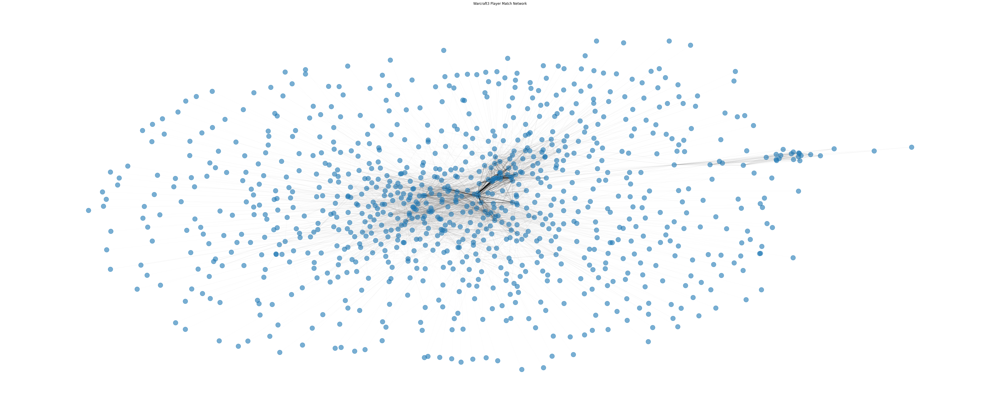

In [100]:
edge_weights = [G_warcraft3[u][v]['weight'] for u, v in G_warcraft3.edges()]
#plt.colorbar(edges, label='Number of matches')
# Normalize weights for better visualization
normalized_weights = [3 * w / max(edge_weights) for w in edge_weights]

plt.figure(figsize=(50, 20))
nx.draw(G_warcraft3, with_labels=False, font_weight='bold', width=normalized_weights, alpha=0.6)
plt.title('Warcraft3 Player Match Network')
plt.axis('off')
plt.tight_layout()
plt.show()

In [134]:
# Get the number of communities
num_communities_warcraft3 = len(set(community_louvain.best_partition(G_warcraft3).values()))

print(f"Number of clusters detected: {num_communities_warcraft3}")

Number of clusters detected: 6


### Warcraft 3 - draw a game graph with between players who played over 40 games in the career

In [138]:
games_wc3_betw_regs = games[games.winner.isin(players_ge_40_matches_lst) & games.loser.isin(players_ge_40_matches_lst)]

In [139]:
len(games_wc3_betw_regs)

12094

In [140]:
match_counts_wc3_betw_regs = {}
for _, row in games_wc3_betw_regs.iterrows():
   # This ensures that ('PlayerA', 'PlayerB') and ('PlayerB', 'PlayerA') are treated as the same pair
    pair = tuple(sorted([row['winner'], row['loser']]))
    match_counts_wc3_betw_regs[pair] = match_counts_wc3_betw_regs.get(pair, 0) + 1

In [141]:
G_wc3_betw_regs = nx.Graph()

In [142]:
for (player1, player2), count in match_counts_wc3_betw_regs.items():
    G_wc3_betw_regs.add_edge(player1, player2, weight=count)

In [143]:
G_wc3_betw_regs.number_of_nodes()

175

/var/folders/sg/52_wwpld14z_lvc4rf4zy9x00000gn/T/ipykernel_8649/1110345675.py:10: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


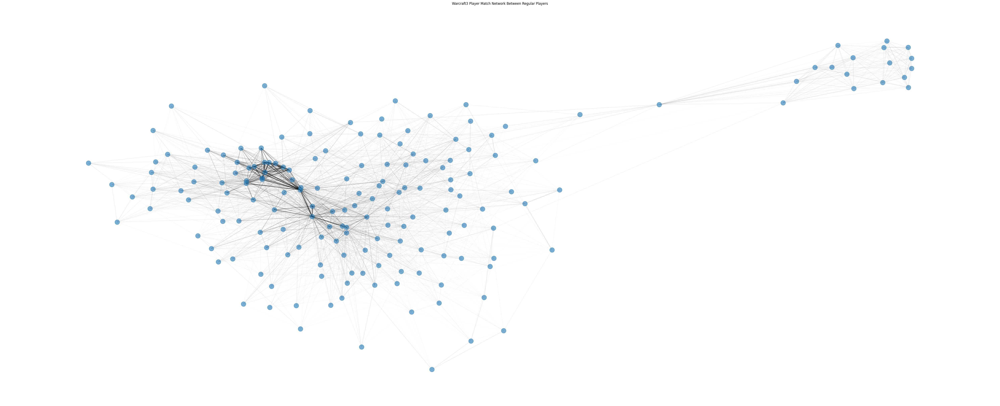

In [144]:
edge_weights_wc3_betw_regs = [G_wc3_betw_regs[u][v]['weight'] for u, v in G_wc3_betw_regs.edges()]
#plt.colorbar(edges, label='Number of matches')
# Normalize weights for better visualization
normalized_weights_wc3_betw_regs = [3 * w / max(edge_weights_wc3_betw_regs) for w in edge_weights_wc3_betw_regs]

plt.figure(figsize=(50, 20))
nx.draw(G_wc3_betw_regs, with_labels=False, font_weight='bold', width=normalized_weights_wc3_betw_regs, alpha=0.6)
plt.title('Warcraft3 Player Match Network Between Regular Players')
plt.axis('off')
plt.tight_layout()
plt.show()

In [145]:
# Get the number of communities
num_communities_warcraft3_betw_regs = len(set(community_louvain.best_partition(G_wc3_betw_regs).values()))

print(f"Number of clusters detected: {num_communities_warcraft3_betw_regs}")

Number of clusters detected: 5


### draw network graph for boxing games - draw a game graph with at least one player who played over 40 games in the career

In [ ]:
# games_ge_40_train_df = pd.read_csv("data/oos_eval/games_ge_40_train.csv")
# games_ge_40_test_df = pd.read_csv("data/oos_eval/games_ge_40_test.csv")
# games_ge_40_train_df.timestamp = pd.to_datetime(games_ge_40_train_df.timestamp)
# games_ge_40_test_df.timestamp = pd.to_datetime(games_ge_40_test_df.timestamp)
# len(games_ge_40_train_df)

In [114]:
boxing_games = pd.read_parquet("data/boxing_matches_refined.parquet")
boxing_games = boxing_games.rename(columns={'Winner': 'winner', 'Loser': 'loser', 'Date': 'timestamp'})

In [115]:
len(boxing_games)
#total boxing games: 25651, num of games with at least one regular boxer: 20711

25651

In [116]:
with open("data/players_ge_40_matches_lst.json", "r") as f:
    boxers_ge_40_matches_lst = json.load(f)

In [117]:
boxing_games = boxing_games[boxing_games.winner.isin(boxers_ge_40_matches_lst) 
                            | boxing_games.loser.isin(boxers_ge_40_matches_lst)]

In [118]:
len(boxing_games)

20711

In [119]:
boxing_match_counts = {}
for _, row in boxing_games.iterrows():
   # This ensures that ('PlayerA', 'PlayerB') and ('PlayerB', 'PlayerA') are treated as the same pair
    pair = tuple(sorted([row['winner'], row['loser']]))
    boxing_match_counts[pair] = boxing_match_counts.get(pair, 0) + 1

In [120]:
G_boxing = nx.Graph()

In [136]:
G_boxing.number_of_nodes()

13127

In [121]:
for (player1, player2), count in boxing_match_counts.items():
    G_boxing.add_edge(player1, player2, weight=count)

In [122]:
# it takes 3mins to calculate, may skip this line
boxing_pos = nx.spring_layout(G_boxing)

/var/folders/sg/52_wwpld14z_lvc4rf4zy9x00000gn/T/ipykernel_8649/2504456485.py:10: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


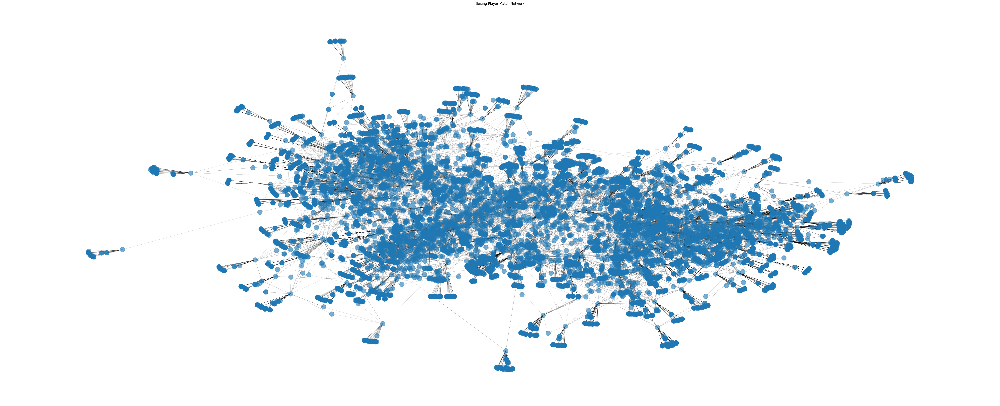

In [123]:
boxing_edge_weights = [G_boxing[u][v]['weight'] for u, v in G_boxing.edges()]
#plt.colorbar(edges, label='Number of matches')
# Normalize weights for better visualization
boxing_normalized_weights = [3 * w / max(boxing_edge_weights) for w in boxing_edge_weights]

plt.figure(figsize=(50, 20))
nx.draw(G_boxing, with_labels=False, font_weight='bold', width=boxing_normalized_weights, alpha=0.6)
plt.title('Boxing Player Match Network')
plt.axis('off')
plt.tight_layout()
plt.show()

In [133]:
# Get the number of communities
num_communities_boxing = len(set(community_louvain.best_partition(G_boxing).values()))

print(f"Number of clusters detected: {num_communities_boxing}")

Number of clusters detected: 29


### Filtering out games with both coming from less regular players, there are more clusters on the boxing graph than in warcraft3, meaning that warcraft3 players play more often with each other. In this way, trueskill algo is more capable of making predictions of the skills based on historical game results.

### boxing - draw a game graph with between players who played over 40 games in the career

In [124]:
boxing_games_betw_regs = boxing_games[boxing_games.winner.isin(boxers_ge_40_matches_lst) 
                            & boxing_games.loser.isin(boxers_ge_40_matches_lst)]

In [125]:
len(boxing_games_betw_regs)

622

In [126]:
boxing_match_counts_betw_regs = {}
for _, row in boxing_games_betw_regs.iterrows():
   # This ensures that ('PlayerA', 'PlayerB') and ('PlayerB', 'PlayerA') are treated as the same pair
    pair = tuple(sorted([row['winner'], row['loser']]))
    boxing_match_counts_betw_regs[pair] = boxing_match_counts_betw_regs.get(pair, 0) + 1

In [127]:
G_boxing_betw_regs = nx.Graph()

In [137]:
G_boxing_betw_regs.number_of_nodes()

265

In [128]:
for (player1, player2), count in boxing_match_counts_betw_regs.items():
    G_boxing_betw_regs.add_edge(player1, player2, weight=count)

/var/folders/sg/52_wwpld14z_lvc4rf4zy9x00000gn/T/ipykernel_8649/1811905681.py:10: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


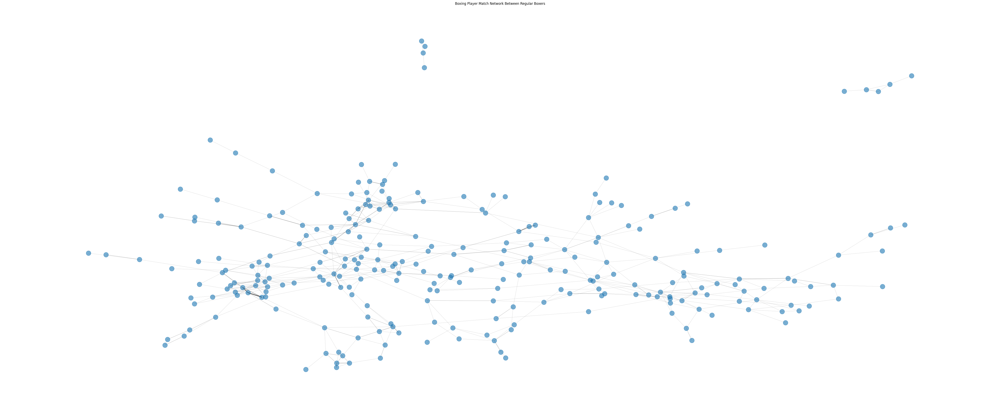

In [129]:
boxing_edge_weights_betw_regs = [G_boxing[u][v]['weight'] for u, v in G_boxing_betw_regs.edges()]
#plt.colorbar(edges, label='Number of matches')
# Normalize weights for better visualization
boxing_normalized_weights_betw_regs = [3 * w / max(boxing_edge_weights_betw_regs) for w in boxing_edge_weights_betw_regs]

plt.figure(figsize=(50, 20))
nx.draw(G_boxing_betw_regs, with_labels=False, font_weight='bold', width=boxing_normalized_weights_betw_regs, alpha=0.6)
plt.title('Boxing Player Match Network Between Regular Boxers')
plt.axis('off')
plt.tight_layout()
plt.show()

In [132]:
# Get the number of communities
num_communities_boxing_betw_regs = len(set(community_louvain.best_partition(G_boxing_betw_regs).values()))

print(f"Number of clusters detected: {num_communities_boxing_betw_regs}")

Number of clusters detected: 16


### UFC entire data(7660 matches)

In [4]:
ufc_games = pd.read_parquet("data/ufc_matches_refined_v2.parquet")

In [6]:
len(ufc_games)

7660

In [9]:
ufc_games.head()

,winner,loser,timestamp
0,Viacheslav Datsik,Andrei Arlovski,1999-04-09
1,Andrei Arlovski,Roman Zentsov,2000-04-09
2,Andrei Arlovski,Michael Tielrooy,2000-04-09
3,Andrei Arlovski,John Dixson,2000-05-13
4,Andrei Arlovski,Aaron Brink,2000-11-17


In [7]:
ufc_match_counts = {}
for _, row in ufc_games.iterrows():
   # This ensures that ('PlayerA', 'PlayerB') and ('PlayerB', 'PlayerA') are treated as the same pair
    pair = tuple(sorted([row['winner'], row['loser']]))
    ufc_match_counts[pair] = ufc_match_counts.get(pair, 0) + 1

In [10]:
G_ufc = nx.Graph()

In [11]:
for (player1, player2), count in ufc_match_counts.items():
    G_ufc.add_edge(player1, player2, weight=count)
G_ufc.number_of_nodes()

4896

In [ ]:
#ufc_pos = nx.spring_layout(G_ufc)

/var/folders/sg/52_wwpld14z_lvc4rf4zy9x00000gn/T/ipykernel_49366/3464579423.py:10: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


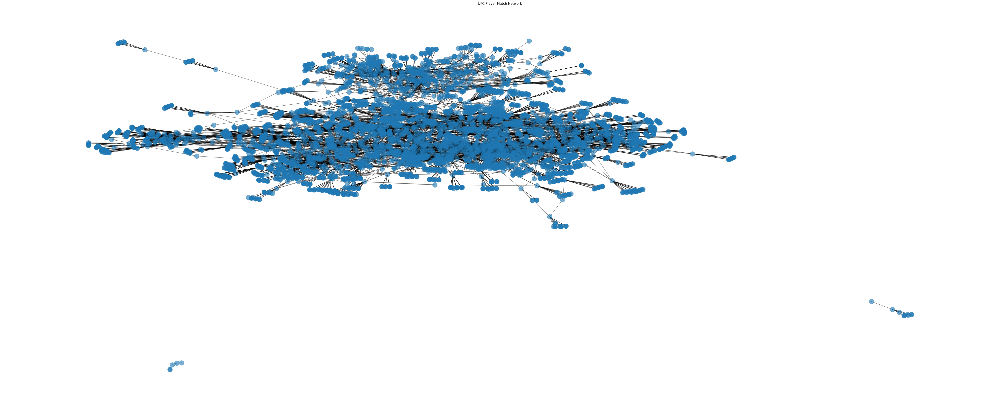

In [12]:
ufc_edge_weights = [G_ufc[u][v]['weight'] for u, v in G_ufc.edges()]
#plt.colorbar(edges, label='Number of matches')
# Normalize weights for better visualization
ufc_normalized_weights = [3 * w / max(ufc_edge_weights) for w in ufc_edge_weights]

plt.figure(figsize=(50, 20))
nx.draw(G_ufc, with_labels=False, font_weight='bold', width=ufc_normalized_weights, alpha=0.6)
plt.title('UFC Player Match Network')
plt.axis('off')
plt.tight_layout()
plt.show()

In [13]:
# Get the number of communities
num_communities_ufc = len(set(community_louvain.best_partition(G_ufc).values()))

print(f"Number of clusters detected: {num_communities_ufc}")

Number of clusters detected: 23


### there are similar clusters on the UFC graph compared to the boxing graph(29 communities) given that UFC has only 7660 matches, meaning that UFC players play less often with each other as in Warcraft3. In this way, trueskill algo is less capable of making predictions of the skills based on historical game results.